<a href="https://www.kaggle.com/code/kawaho/wgaan-celeba?scriptVersionId=94178177" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
from __future__ import print_function
import random
import math
import torch
import torch.nn as nn
from torch import autograd
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

# Set random seed for reproducibility
manualSeed = 999
#manualSeed = random.randint(1, 10000) # use if you want new results
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  999


In [2]:
# Root directory for dataset
dataroot = "../input/celeba-dataset/img_align_celeba/"

# Number of workers for dataloader
workers = 2

# Batch size during training
batch_size = 128

# Spatial size of training images. All images will be resized to this
#   size using a transformer.
image_size = 64

# Number of channels in the training images. For color images this is 3
nc = 3

# Number of rounds to update the discriminator
n_critic = 5

# Size of z latent vector (i.e. size of generator input)
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

# Number of training epochs
num_epochs = 5

# Learning rate for optimizers
lr = 0.0001

# Beta hyperparams for Adam optimizers
beta1 = 0
beta2 = 0.99

# Number of GPUs available. Use 0 for CPU mode.
ngpu = 1

In [3]:
# We can use an image folder dataset 
# Create the dataset
dataset = dset.ImageFolder(root=dataroot,
                           transform=transforms.Compose([
                                    transforms.Resize(image_size),
                                    transforms.CenterCrop(image_size),
                                    transforms.ToTensor(),
                                    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ]))
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

Text(0.5, 1.0, 'Training Images')

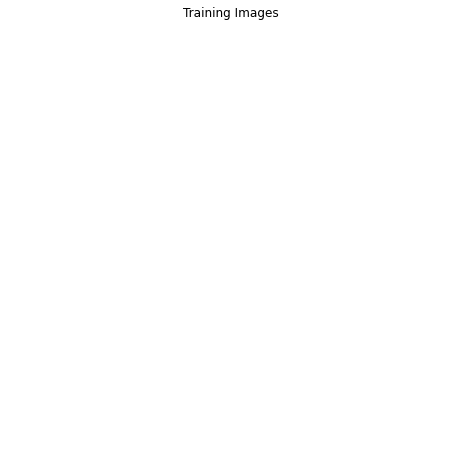

In [4]:
# Decide which device we want to run on
device = torch.device("cuda:0" if (torch.cuda.is_available() and ngpu > 0) else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")

# Commented out to reduce size of notebook output
#Normalize color so its easier to see
#plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

In [5]:
#to store training metrics
!mkdir tb

In [6]:
# Workaround to access tensorboard in kaggle 
# Copied from https://www.kaggle.com/code/shivam1600/tensorboard-on-kaggle/notebook
# Download Ngrok to tunnel the tensorboard port to an external port
!wget https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
!unzip ngrok-stable-linux-amd64.zip
!cp ../input/ngrok-token/ngrok.yml /root/.ngrok2/ngrok.yml

# Run tensorboard as well as Ngrox (for tunneling as non-blocking processes)
import os
import multiprocessing

pool = multiprocessing.Pool(processes = 10)
results_of_processes = [pool.apply_async(os.system, args=(cmd, ), callback = None )
                        for cmd in [
                        f"tensorboard --logdir ./tb/ --host 0.0.0.0 --port 6006 &",
                        "./ngrok http 6006 &"
                        ]]
! curl -s http://localhost:4040/api/tunnels | python3 -c \
    "import sys, json; print(json.load(sys.stdin)['tunnels'][0]['public_url'])"

--2022-04-27 19:45:22--  https://bin.equinox.io/c/4VmDzA7iaHb/ngrok-stable-linux-amd64.zip
Resolving bin.equinox.io (bin.equinox.io)... 52.202.168.65, 54.161.241.46, 54.237.133.81, ...
Connecting to bin.equinox.io (bin.equinox.io)|52.202.168.65|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 13832437 (13M) [application/octet-stream]
Saving to: ‘ngrok-stable-linux-amd64.zip’

ngrok-stable-linux- 100%[===================>]  13.19M  19.0MB/s    in 0.7s    

2022-04-27 19:45:23 (19.0 MB/s) - ‘ngrok-stable-linux-amd64.zip’ saved [13832437/13832437]

Archive:  ngrok-stable-linux-amd64.zip
  inflating: ngrok                   
cp: cannot create regular file '/root/.ngrok2/ngrok.yml': No such file or directory
http://717c-34-105-67-224.ngrok.io


In [7]:
# custom weights initialization called on netD
def weights_init(m):
    classname = m.__class__.__name__
    # Initialization in original DCGAN paper
    #if classname.find('Conv') != -1:
        #nn.init.normal_(m.weight, 0.0, 0.02)
    #He initialization
    if classname.find('ConvTranspose2d') != -1:
        nn.init.kaiming_normal_(m.weight, mode='fan_in', nonlinearity='relu')
    if classname.find('Conv2d') != -1:
        nn.init.kaiming_normal_(m.weight, a=0.2, mode='fan_in', nonlinearity='leaky_relu')
    if classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight, 1.0, 0.02)
        nn.init.constant_(m.bias, 0)

In [8]:
# Class of Equalizing Learning Rate
# Modified from github.com/rosinality/style-based-gan-pytorch
class EqualLR:
    
    def __init__(self, name):
        self.name = name
        
    def compute_weight(self, module):
        weight = getattr(module, self.name + '_orig')
        fan_in = np.prod(weight.data.size()[1:])
        return weight * np.sqrt(2 / fan_in)

    @staticmethod
    def apply(module, name):
        fn = EqualLR(name)
        weight = getattr(module, name)
        del module._parameters[name]
        module.register_parameter(name + '_orig', nn.Parameter(weight.data))
        module.register_forward_pre_hook(fn)
        return fn
    
    def __call__(self, module, input):
        weight = self.compute_weight(module)
        setattr(module, self.name, weight)


def equal_lr(module, name='weight'):
    EqualLR.apply(module, name)
    return module


class EqualizedConv2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()
        conv = nn.Conv2d(*args, **kwargs)
        conv.weight.data.normal_(0,0.02)
        if kwargs['bias']:
            conv.bias.data.zero_()
        self.conv = equal_lr(conv)

    def forward(self, input):
        return self.conv(input)
    
class EqualizedConvTranspose2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()
        conv = nn.ConvTranspose2d(*args, **kwargs)
        conv.weight.data.normal_(0,0.02)
        if kwargs['bias']:
            conv.bias.data.zero_()
        self.conv = equal_lr(conv)

    def forward(self, input):
        return self.conv(input)
    
class EqualizedBatchNorm2d(nn.Module):
    def __init__(self, *args, **kwargs):
        super().__init__()
        bnorm = nn.BatchNorm2d(*args, **kwargs)
        bnorm.weight.data.normal_(1,0.02)
        bnorm.bias.data.zero_()
        self.bnorm = equal_lr(bnorm)

    def forward(self, input):
        return self.bnorm(input)

In [9]:
# Generator Code

class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is Z, going into a convolution
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            #nn.LeakyReLU(0.2, inplace=True),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            #nn.LeakyReLU(0.2, inplace=True),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            #nn.LeakyReLU(0.2, inplace=True),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            #nn.LeakyReLU(0.2, inplace=True),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [10]:
# Create the generator
netG = Generator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netG = nn.DataParallel(netG, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
netG.apply(weights_init)

# Print the model
print(netG)

#summary(netG, (100, 1, 1), batch_size=128)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [11]:
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.LayerNorm([ndf * 2, 16, 16]),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.LayerNorm([ndf * 4, 8, 8]),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.LayerNorm([ndf * 8, 4, 4]),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
        )

    def forward(self, input):
        self.main(input)
        return self.main(input)

In [12]:
# Create the Discriminator
netD = Discriminator(ngpu).to(device)

# Handle multi-gpu if desired
if (device.type == 'cuda') and (ngpu > 1):
    netD = nn.DataParallel(netD, list(range(ngpu)))

# Apply the weights_init function to randomly initialize all weights
netD.apply(weights_init)

# Print the model
print(netD)
#summary(netD, (3, 64, 64))

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): LayerNorm((128, 16, 16), eps=1e-05, elementwise_affine=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): LayerNorm((256, 8, 8), eps=1e-05, elementwise_affine=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): LayerNorm((512, 4, 4), eps=1e-05, elementwise_affine=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): LeakyReLU(negative_slope=0.2, inplace=True)
  )
)


In [13]:
def gradient_penalty(netD, real, fake, device, lambda_=10):
    
    batch_size = real.size(0)
    epsilon = torch.rand(batch_size, 1, 1, 1, device=device).expand(real.size())

    real_fake = epsilon * real + (1 - epsilon) * fake
    real_fake.requires_grad_().to(device)

    critic_output = netD(real_fake)
        
    gradients = autograd.grad(outputs=critic_output,
                              inputs=real_fake,
                              grad_outputs=torch.ones(critic_output.size()).to(device),
                              create_graph=True)[0]

    return ((gradients.norm(2, dim=(1,2,3)) - 1) ** 2).mean() * lambda_

In [14]:
# Create batch of latent vectors that we will use to visualize
#  the progression of the generator
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

# Setup Adam optimizers for both G and D
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, beta2))

In [15]:
# clear metrics from last run 
!rm tb/*

rm: cannot remove 'tb/*': No such file or directory


In [16]:
from tensorboardX import SummaryWriter
logger = SummaryWriter('./tb')

# To log max norm of a given layer to detect exploding/vanishing gradient
def log_gradients_norm_in_model(model, logger, step):
    list_ = []
    for name, module in model.named_children():
        for n, m in module.named_children():
            list_max = []
            for p in m.parameters():
                if p.grad is not None:
                    #list_.append(torch.norm(p.grad.cpu(), 1))
                    list_max.append(p.grad.cpu().abs().max())
                
            #total_num_of_params = sum(np.prod(p.size()) for p in m.parameters())
            if len(list_max) == 0: continue
            #norm = torch.norm(torch.stack(list_), 1)
            norm_max = torch.max(torch.stack(list_max))
            #logger.add_scalar(f'{model._get_name()}_avg/{name}/{n}', norm/total_num_of_params, step)
            logger.add_scalar(f'{model._get_name()}_max/{name}/{n}', norm_max, step)
            logger.flush()

Starting Training Loop...


2022-04-27 19:45:34.177860: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-27 19:45:34.301585: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-04-27 19:45:34.303986: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero

NOTE: Using experimental fast data loading logic. To disable, pass
    "--load_fast=false" and report issues on GitHub. More details:
    https://github.com/tensorflow/tensorboard/issues/4784

TensorBoard 2.6.0 at http://0.0.0.0:6006/ (Press CTRL+C to quit)


[0/5][0/1583]	 Wasserstein_Distance: -13.3656	Mean_G: 15.3075	Mean_D_REAL: 0.6264	Mean_D_FAKE: 12.6428
[0/5][50/1583]	 Wasserstein_Distance: -115.5329	Mean_G: 120.8053	Mean_D_REAL: 29.1920	Mean_D_FAKE: 124.9885
[0/5][100/1583]	 Wasserstein_Distance: -111.8189	Mean_G: 136.1381	Mean_D_REAL: 28.8747	Mean_D_FAKE: 115.5182
[0/5][150/1583]	 Wasserstein_Distance: -70.3767	Mean_G: 119.4691	Mean_D_REAL: 26.6955	Mean_D_FAKE: 84.3236
[0/5][200/1583]	 Wasserstein_Distance: -108.6186	Mean_G: 101.6512	Mean_D_REAL: 38.9978	Mean_D_FAKE: 118.0915
[0/5][250/1583]	 Wasserstein_Distance: -71.1027	Mean_G: 125.6547	Mean_D_REAL: 39.1279	Mean_D_FAKE: 98.0117
[0/5][300/1583]	 Wasserstein_Distance: -57.0053	Mean_G: 122.8323	Mean_D_REAL: 41.6906	Mean_D_FAKE: 89.1449
[0/5][350/1583]	 Wasserstein_Distance: -52.1030	Mean_G: 122.6050	Mean_D_REAL: 56.1589	Mean_D_FAKE: 101.8796
[0/5][400/1583]	 Wasserstein_Distance: -75.7713	Mean_G: 111.9244	Mean_D_REAL: 60.8685	Mean_D_FAKE: 116.6509
[0/5][450/1583]	 Wasserstein_Dista

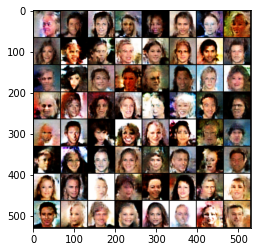

In [17]:
# Training Loop
# Lists to keep track of progress
img_list = []
G_losses = []
D_losses = []
iters = 0

print("Starting Training Loop...")
# For each epoch
for epoch in range(num_epochs):
    # For each batch in the dataloader
    for i, data in enumerate(dataloader, 0):
        # Format batch
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)

        for j in range(n_critic):

            ############################
            # (1) Update D network: maximize log(D(x)) + log(1 - D(G(z)))
            ###########################
            ## Train with all-real batch
            netD.zero_grad()

            # Forward pass real batch through D
            output = netD(real_cpu).view(-1)
            # Calculate D's output mean on all-real batch
            mean_real = output.mean()
            # Calculate gradients for D in backward pass
            mean_real.backward(gradient=torch.tensor(1., dtype=torch.float, device=device))

            D_x = mean_real.item()

            ## Train with all-fake batch
            # Generate batch of latent vectors
            noise = torch.randn(b_size, nz, 1, 1, device=device)
            # Generate fake image batch with G
            fake = netG(noise)
            # Classify all fake batch with D
            output = netD(fake.detach()).view(-1)
            # Calculate D's output on the all-fake batch
            mean_fake = output.mean()
            # Calculate the gradients for this batch, accumulated (summed) with previous gradients
            mean_fake.backward(gradient=torch.tensor(-1., dtype=torch.float, device=device))
            
            penalty = gradient_penalty(netD, real_cpu, fake.detach(), device)
            penalty.backward()

            D_G_z1 = mean_fake.item()
            # Compute error of D as sum over the fake and the real batches
            errD = mean_real - mean_fake - penalty
            # Update D
            optimizerD.step()

        ############################
        # (2) Update G network: maximize log(D(G(z)))
        ###########################
        netG.zero_grad()
        # Generate batch of latent vectors
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        # Since we just updated D, perform another forward pass of all-fake batch through D
        output = netD(fake).view(-1)
        # Calculate D's output on the all-fake batch
        mean_fake = output.mean()
        # Calculate gradients for G
        mean_fake.backward(gradient=torch.tensor(1., dtype=torch.float, device=device))

        errG = mean_fake.item()
        # Update G
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\t Wasserstein_Distance: %.4f\tMean_G: %.4f\tMean_D_REAL: %.4f\tMean_D_FAKE: %.4f'
                  % (epoch, num_epochs, i, len(dataloader),
                     errD.item(), errG, D_x, D_G_z1))

        # Save Losses for plotting later
        G_losses.append(errG)
        D_losses.append(errD.item())
        
        # Log gradients
        log_gradients_norm_in_model(netD, logger, iters)
        log_gradients_norm_in_model(netG, logger, iters)

        # Check how the generator is doing by saving G's output on fixed_noise
        if (iters % 500 == 0) or ((epoch == num_epochs-1) and (i == len(dataloader)-1)):
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            plt.imshow(np.transpose(img_list[-1],(1,2,0)))

        iters += 1
logger.close()

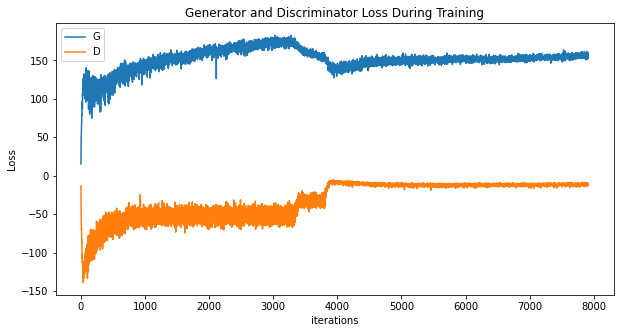

In [18]:
# Commented out to reduce size of notebook output
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

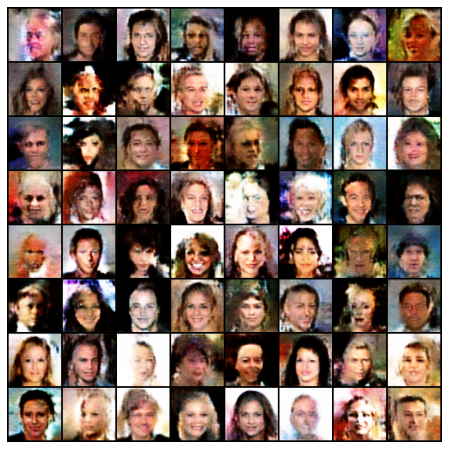

In [19]:
# Commented out to reduce size of notebook output
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

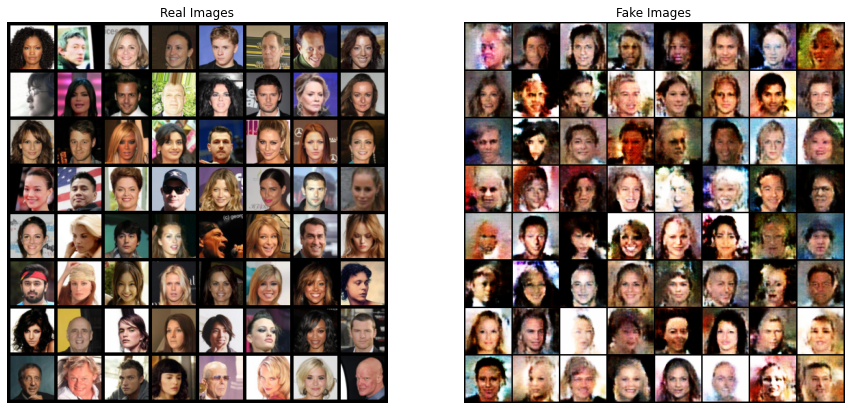

In [20]:
# Grab a batch of real images from the dataloader
real_batch = next(iter(dataloader))

# Plot the real images
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

# Plot the fake images from the last epoch
plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

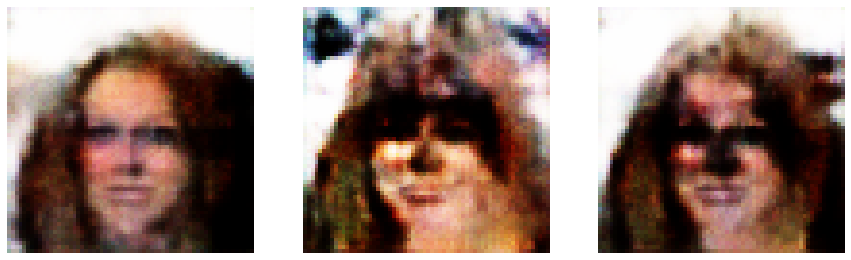

In [21]:
# Commented out to reduce size of notebook output
# Some demo of latent arithmetics 
noise = torch.randn(1, nz, 1, 1, device=device)
noise2 = torch.randn(1, nz, 1, 1, device=device)
noise3 = noise+noise2

fake = netG(noise).detach().cpu()
fake2 = netG(noise2).detach().cpu()
fake3 = netG(noise3).detach().cpu()

fake_img = vutils.make_grid(fake, padding=2, normalize=True)
fake_img2 = vutils.make_grid(fake2, padding=2, normalize=True)
fake_img3 = vutils.make_grid(fake3, padding=2, normalize=True)

plt.figure(figsize=(15,15))

plt.subplot(1,3,1)
plt.axis("off")
plt.imshow(np.transpose(fake_img,(1,2,0)))

plt.subplot(1,3,2)
plt.axis("off")
plt.imshow(np.transpose(fake_img2,(1,2,0)))

plt.subplot(1,3,3)
plt.axis("off")
plt.imshow(np.transpose(fake_img3,(1,2,0)))